# Besample Analysis

This is a notebook regarding EDA of bot and real user behavior.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pd.options.display.max_columns = None
pd.options.display.max_info_columns = 100

In [2]:
# Define a function to parse JSON values for users table
def parse_json(json_str):
    try:
        return json.loads(json_str)

    except (json.JSONDecodeError, TypeError):
        return None

# Define a function to load the data file by reading and separating JSON fields
def load_data(data_file_url, json_column_names):
    df = pd.read_csv(data_file_url, sep=",", converters={column: parse_json for column in json_column_names})
    
    for column in json_column_names:
        column_as_df = pd.json_normalize(df[column])
        column_as_df.columns = [f"{column}_{subcolumn}" for subcolumn in column_as_df.columns]
        df = df.drop(column, axis=1).merge(column_as_df, right_index=True, left_index=True)
        
    return df

# Introductory Functions and Data Examination

Profile = respondents’ activity during prescreening process

In [87]:
profile = pd.read_csv('data/profile.csv')
(profile.head(), profile.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4230 entries, 0 to 4229
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               4230 non-null   int64 
 1   user_id          4230 non-null   int64 
 2   demography_body  4230 non-null   object
 3   age_min          4230 non-null   int64 
 4   age_max          4230 non-null   int64 
 5   gender           4230 non-null   object
 6   created_at       4230 non-null   object
 7   age              4230 non-null   object
 8   country          4230 non-null   object
 9   eyal_answers     2014 non-null   object
 10  silvana_answers  4 non-null      object
dtypes: int64(4), object(7)
memory usage: 363.6+ KB


(     id     user_id                                    demography_body  \
 0  1268   544860584  {"labels": {"QID2": "Male", "QID3": "Married",...   
 1   960  1047000229  {"labels": {"QID2": "Male", "QID3": "Complicat...   
 2   908   865654491  {"labels": {"QID1": "FB", "QID2": "Female", "Q...   
 3  1278   635305682  {"labels": {"QID1": "Friend", "QID2": "Male", ...   
 4  1162  5680929352  {"labels": {"QID1": "Click to write Choice 6",...   
 
    age_min  age_max  gender                  created_at    age  country  \
 0       45       54    male  2024-03-05 09:50:38.316897  45-54  ukraine   
 1       25       34    male  2024-02-28 09:31:13.869523  25-34  ukraine   
 2       25       34  female  2024-02-27 12:03:40.726419  25-34  ukraine   
 3       35       44    male   2024-03-05 15:02:30.32342  35-44  ukraine   
 4       35       44  female  2024-03-03 16:01:59.324326  35-44  ukraine   
 
                                         eyal_answers silvana_answers  
 0                

In [65]:
profile = load_data('data/profile.csv', ['demography_body', 'eyal_answers', 'silvana_answers'])

In [ ]:
profile.info()

Qualtrics = data from script that monitors the process of filling up the demographic survey in Qualtrics (counts clicks, tracks if the respondent typed text or just inserted

In [88]:
qualtrics = pd.read_csv('data/qualtrics_tracker.csv')
(qualtrics.head(), qualtrics.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3896 entries, 0 to 3895
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          3896 non-null   int64 
 1   uuid        3896 non-null   object
 2   data        3896 non-null   object
 3   created_at  3896 non-null   object
dtypes: int64(1), object(3)
memory usage: 121.9+ KB


(   id                                  uuid  \
 0   1  84b0e3ac-320d-46d9-bffd-adaf431e0210   
 1   2  84b0e3ac-320d-46d9-bffd-adaf431e0210   
 2   3  e8c5337f-4f0f-4f45-860f-179d7949186b   
 3   4  84b0e3ac-320d-46d9-bffd-adaf431e0210   
 4   5  84b0e3ac-320d-46d9-bffd-adaf431e0210   
 
                                                 data       created_at  
 0  [{"type": "click", "tagName": "LABEL", "timest...  17:49:50.167487  
 1  [{"type": "click", "tagName": "SELECT", "times...  17:50:00.831716  
 2  [{"type": "click", "tagName": "TEXTAREA", "tim...  17:50:10.542788  
 3  [{"type": "listSelection", "tagName": "SELECT"...  17:50:12.126048  
 4  [{"type": "click", "tagName": "SPAN", "timesta...  17:50:53.165328  ,
 None)

In [66]:
qualtrics = load_data('data/qualtrics_tracker.csv', ['data'])

In [ ]:
qualtrics.info()

Referrals = who invited whom (relevant not for all users)

In [89]:
referrals = pd.read_csv('data/referrals.csv')
# (referrals.head(), referrals.info())

Users Event Log = data from proxy page that is collected every time respondent leaves telegram (to participate in the survey, to get reward for participation in the survey)

In [90]:
event_log = pd.read_csv('data/users_event_log.csv')
(event_log.head(), event_log.info())
event_log.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9281 entries, 0 to 9280
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               9281 non-null   int64  
 1   event            9281 non-null   object 
 2   ip               9281 non-null   object 
 3   agent            9281 non-null   object 
 4   created_at       9280 non-null   object 
 5   extra_data       9281 non-null   object 
 6   user_id          9281 non-null   int64  
 7   recaptcha_score  9213 non-null   float64
 8   comment          68 non-null     object 
 9   proxy_used       8767 non-null   object 
dtypes: float64(1), int64(2), object(7)
memory usage: 725.2+ KB


Index(['id', 'event', 'ip', 'agent', 'created_at', 'extra_data', 'user_id',
       'recaptcha_score', 'comment', 'proxy_used'],
      dtype='object')

In [68]:
event_log = load_data('data/users_event_log.csv', ['extra_data'])
# event_log

In [ ]:
event_log.info()

Users = respondents’ general metadata

In [91]:
users = pd.read_csv('data/users.csv')
(users.head(), users.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5072 entries, 0 to 5071
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            5072 non-null   int64  
 1   user_id       5072 non-null   int64  
 2   status        5072 non-null   object 
 3   created_at    5072 non-null   object 
 4   balance       5072 non-null   int64  
 5   uuid          5072 non-null   object 
 6   pined_msg_id  2919 non-null   float64
 7   came_from     499 non-null    object 
 8   lang          4968 non-null   object 
 9   jira_task     228 non-null    object 
 10  qa_range      0 non-null      float64
 11  ip            4045 non-null   object 
 12  attentive     4004 non-null   object 
 13  campaign      3203 non-null   object 
 14  username      1561 non-null   object 
 15  isBot         370 non-null    object 
 16  lead_channel  1943 non-null   object 
 17  data_fraud    4983 non-null   object 
 18  score         4499 non-null 

(      id    user_id  status                  created_at  balance  \
 0  11230  639539048  active  2024-04-16 07:47:42.064104       27   
 1   3349  612174706  active  2024-03-18 07:15:10.928451      110   
 2  10085  616454733  active  2024-04-01 16:17:05.530395      136   
 3  10805  833975449  active  2024-04-11 09:35:54.153091      110   
 4   3355  251643453  active  2024-03-18 08:03:52.302407      110   
 
                                    uuid  pined_msg_id came_from lang  \
 0  4a50c590-374e-4e91-87f5-11ccfc47ce55      174848.0       NaN   ua   
 1  ebffd100-2e64-43a6-abe9-acf0cfe3f42d       96604.0       NaN   ua   
 2  1dd2adbd-9848-4bcd-91d5-4a4638608857           NaN       NaN   ua   
 3  1ef2bc6b-cc33-4512-8cb6-11d5915853fe           NaN       NaN   ua   
 4  55c7a1b8-39c5-4094-a770-7a3b2bd67307       96701.0       NaN   ua   
 
   jira_task  qa_range               ip attentive           campaign  \
 0       NaN       NaN  178.133.129.176         t                NaN   


In [117]:
users = load_data('./data/users.csv', ['data_fraud'])

In [ ]:
users

## Merge into Full

Let's just left join everything onto the users table, because this is where the isBot variable resides.

In [4]:
full = users.merge(profile, how='left', on='user_id', suffixes=['_users', '_profile'])
full = full.merge(qualtrics, how='left', on='uuid', suffixes=['', '_qualtrics'])
full = full.merge(referrals, how='left', on='uuid', suffixes=['', '_referrals'])
full = full.merge(event_log, how='left', on='user_id', suffixes=['', '_event_log'])
full.info()
full

NameError: name 'users' is not defined

The resulting table contains 756 isBot values, compared to the original 370. Based on the first few rows, I believe it is because a number of users have been duplicated, due to the same user taking multiple different actions, like using the shop and the presurvey. I'll keep these duplicates for now.

## Model Training & Validation

In [5]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate, GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

In [6]:
target = full.isBot.fillna('f')

NameError: name 'full' is not defined

Feature engineer ideas: activity frequency, IP uniqueness, profile completeness, Captcha scores.

In [6]:
features = full.drop([
        # 'campaign', 'came_from', 'demography_body', 'eyal_answers', 'silvana_answers', 'data', 'extra_data', 
                             'score', 'id_users', 'isBot', 'user_id', 'created_at_users', 'uuid', 'pined_msg_id', 'jira_task', 'qa_range', 'ip', 'username', \
                             'id_profile', 'created_at_profile',  'id',  'created_at', 'eyal_answers', 'silvana_answers', 'extra_data', 'data', \
                             'id_referrals', 'created_at_referrals', 'id_event_log', 'ip_event_log', 'created_at_event_log', ], axis=1)

NameError: name 'full' is not defined

# Testing Using Trimmed Dataset

Trimmed dataset, i.e. omitting JSON entries, aside from the limited `data_fraud` column.

In [3]:
profile = pd.read_csv('data/profile.csv')
qualtrics = pd.read_csv('data/qualtrics_tracker.csv')
referrals = pd.read_csv('data/referrals.csv')
event_log = pd.read_csv('data/users_event_log.csv')
users = load_data('./data/users.csv', ['data_fraud']) # Loading JSON data here

# Merge all into master dataframe, starting with `users` dataframe
full = users.merge(profile, how='left', on='user_id', suffixes=['_users', '_profile'])
full = full.merge(qualtrics, how='left', on='uuid', suffixes=['', '_qualtrics'])
full = full.merge(referrals, how='left', on='uuid', suffixes=['', '_referrals'])
full = full.merge(event_log, how='left', on='user_id', suffixes=['', '_event_log'])

In [4]:
# Create target, fill nans
target = full.isBot.fillna('f')

# Create features by dropping columns that are heavily correlated with target (`score`) or are unique IDs/impractical to encode/irrelevant
features = full.drop(['score', 'id_users', 'isBot', 'user_id', 'uuid', 'pined_msg_id', 'jira_task', 'qa_range', 'ip', 'data', \
                      'username', 'id_profile', 'id', 'id_referrals', 'demography_body', 'eyal_answers', 'silvana_answers', 'extra_data',\
                      'id_event_log', 'ip_event_log', 'age_min', 'age_max'], axis=1)

In [77]:
# Create target, fill nans
target = full.isBot.fillna('f')

# Create features by dropping columns that are heavily correlated with target (`score`) or are unique IDs/impractical to encode/irrelevant
features = full.drop(['score', 'id_users', 'isBot', 'user_id', 'uuid', 'pined_msg_id', 'jira_task', 'qa_range', 'ip', 'data', \
                      'username', 'id_profile', 'id', 'id_referrals', 'demography_body', 'eyal_answers', 'silvana_answers', 'extra_data',\
                      'id_event_log', 'ip_event_log', 'age_min', 'age_max', 'created_at_users', 'created_at_profile', 'created_at_referrals', 'created_at_event_log', 'created_at'], axis=1)

In [5]:
features.event.value_counts()

event
presurvey     17144
cert           2053
shop            381
demo            349
eyal            257
presurvey?        6
van_horne         1
shop"             1
Name: count, dtype: int64

Some feature engineering - use datetime features, and simplify agent column

In [6]:
# Get hour from the created_at column
features.created_at = pd.to_datetime(full.created_at, format='%H:%M:%S.%f').dt.hour

# Get hour, day, month from the referrals date column
features.created_at_referrals = pd.to_datetime(features.created_at_referrals, format='%Y-%m-%d %H:%M:%S.%f')
features['created_at_referrals_hour'] = features.created_at_referrals.dt.hour
# features['created_at_referrals_month'] = features.created_at_referrals.dt.month
# features['created_at_referrals_day'] = features.created_at_referrals.dt.day

# Get hour, day, month from event log
features.created_at_event_log = pd.to_datetime(features.created_at_event_log, format='mixed', yearfirst=True)
features['created_at_event_log_hour'] = features.created_at_event_log.dt.hour
# features['created_at_event_log_month'] = features.created_at_event_log.dt.month
# features['created_at_event_log_day'] = features.created_at_event_log.dt.day

# Get dt features from users
features.created_at_users = pd.to_datetime(features.created_at_users, format='%Y-%m-%d %H:%M:%S.%f')
features['created_at_users_hour'] = features.created_at_users.dt.hour
# features['created_at_users_month'] = features.created_at_users.dt.month
# features['created_at_users_day'] = features.created_at_users.dt.day

# Get dt features from profile
features.created_at_profile = pd.to_datetime(features.created_at_profile, format='%Y-%m-%d %H:%M:%S.%f')
features['created_at_profile_hour'] = features.created_at_profile.dt.hour
# features['created_at_profile_month'] = features.created_at_profile.dt.month
# features['created_at_profile_day'] = features.created_at_profile.dt.day

features = features.drop(['created_at', 'created_at_referrals', 'created_at_event_log', 'created_at_users', 'created_at_profile'], axis=1)

In [7]:
# Engineer new abbreviated agent column based on the primary existing agent 
features['agent_sub'] = features.agent.apply(
    lambda x: 'iPhone' if 'iPhone' in str(x) else 
              'Linux' if 'Linux' in str(x) else 
              'Macintosh' if 'Macintosh' in str(x) else 
              'Windows' if 'Windows' in str(x) else 
              'Android' if 'Android' in str(x) else 
              'X11' if 'X11' in str(x) else 
              'Other'  # Default value for unmatched cases
)
features = features.drop('agent', axis=1)                          

In [8]:
# Store categorical and numeric column names
cats = list(features.select_dtypes('object').columns)
nums = list(features.select_dtypes('number').columns)

# Quickly fill missing values with 'missing' or 0 and convert numeric to float
for cat in cats:
    features[cat] = features[cat].fillna('missing').astype(str)
for num in nums:
    features[num] = features[num].fillna(0)
    features[num] = features[num].astype('float')

In [9]:
from sklearn.preprocessing import OrdinalEncoder

# Convert target to binary values
target = target.apply(lambda x: 1 if x == 't' else 0)

# Identify categorical columns
categorical_columns = features.select_dtypes(include=['object']).columns

# Convert all categorical columns to strings
features[categorical_columns] = features[categorical_columns].astype(str)

# Encode categorical columns
encoder = OrdinalEncoder()
features[categorical_columns] = encoder.fit_transform(features[categorical_columns])

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Scale the data
scaler = StandardScaler()
X_train_smote_scaled = scaler.fit_transform(X_train_smote)
X_test_scaled = scaler.transform(X_test)

# Train a random forest model
model = RandomForestClassifier(random_state=42)
model.fit(X_train_smote_scaled, y_train_smote.values.ravel())

# Predict on the test set
y_pred = model.predict(X_test_scaled)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)


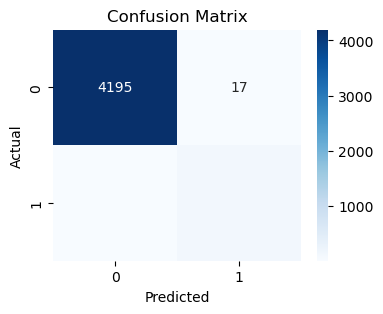

precision, recall, f1


(0.8896103896103896, 0.9133333333333333, 0.9013157894736842)

In [10]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Evaluate additional metrics
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print('precision, recall, f1')
precision, recall, f1


Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      4212
           1       0.89      0.91      0.90       150

    accuracy                           0.99      4362
   macro avg       0.94      0.95      0.95      4362
weighted avg       0.99      0.99      0.99      4362



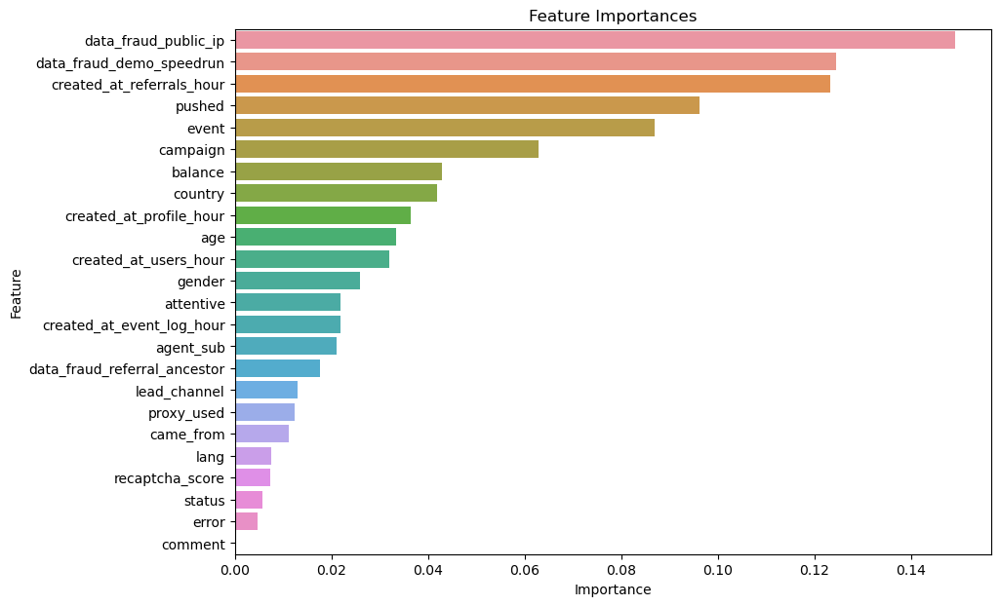

In [11]:
from sklearn.metrics import classification_report

# Generate a full classification report
class_report = classification_report(y_test, y_pred)

print("Classification Report:\n", class_report)

# Feature importances
feature_importances = pd.Series(model.feature_importances_, index=features.columns).sort_values(ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 7))
sns.barplot(x=feature_importances.values, y=feature_importances.index)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


In [12]:
features.event.value_counts(normalize=True)

event
4.0    0.786097
0.0    0.094135
3.0    0.074144
6.0    0.017470
1.0    0.016003
2.0    0.011784
5.0    0.000275
8.0    0.000046
7.0    0.000046
Name: proportion, dtype: float64

In [13]:
features.pushed.value_counts()

pushed
0.0    21180
1.0      629
Name: count, dtype: int64

In [70]:
# features[target==True].created_at_referrals_hour.value_counts()

In [72]:
# features[target==True].created_at_profile_hour.value_counts()

As previously discussed, recaptcha_score is unfortunately a poor indicator of bothood given their recent captcha skills. Proxy_used is surprisingly also a poor indicator, as one would think bots would always use proxies - perhaps the bots use proxies that exceed the ability of this organization to detect their usage. 

The data fraud values appear to be important, notably the public IP fraud status and the speedrun status - these values being True is a key indicator of bots in terms of who Besample has decided is a bot - it would be interesting to reverse engineer the results of an unsupervised learning model labeling data entries as bots and see how they compare.

The hour that referrals were created at appears to be substantial - perhaps bots get referred at irregular hours - could compare these times to the time zone of the respondant's region.

Let's choose a decision tree and observe the different pathways.

In [21]:
from sklearn import tree

estimator = model.estimators_[0]

# Plot the tree
plt.figure(figsize=(450,60)) # Adjust this (width, height) figsize parameter to further separate or condense the boxes
tree.plot_tree(estimator, feature_names=features.columns, class_names=['Not Bot', 'Bot'], filled=True, rounded=True, fontsize=12, max_depth=None)
plt.savefig('decision_tree_visualization.png')

### Testing with Less-Trimmed Datasets

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

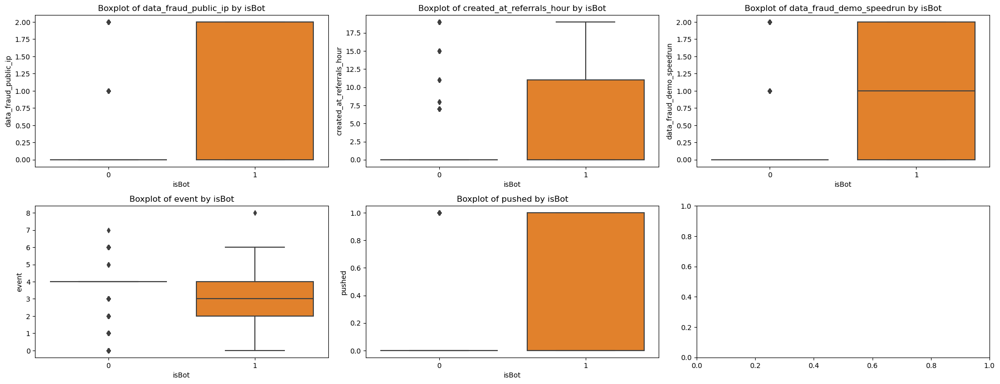

In [17]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'features' and 'target' are your original DataFrame after preprocessing
# We use the same features DataFrame as used for PCA before

# Top 10 features based on earlier loading scores (update this list based on your specific analysis)
top_features = [
    'data_fraud_public_ip',
    'created_at_referrals_hour',
    'data_fraud_demo_speedrun',
    'event',
    'pushed',
    'campaign',
    'country',
    'status',
    'campaign',
    'balance',
    'country',
    'created_at_profile_hour',
    'age',
]

# Combine features and target for visualization
data = features[top_features].copy()
data['isBot'] = target

# Plot box plots for each feature against the target
plt.figure(figsize=(20, 15))
for i, feature in enumerate(top_features, 1):
    plt.subplot(4, 3, i)
    sns.boxplot(x='isBot', y=feature, data=data)
    plt.title(f'Boxplot of {feature} by isBot')
    plt.tight_layout()

plt.show()

# Calculate and display correlation coefficients with the target
correlations = data.corr()['isBot'].drop('isBot')
print(correlations)

# Visualize correlations with scatter plots
plt.figure(figsize=(20, 15))
for i, feature in enumerate(top_features, 1):
    plt.subplot(4, 3, i)
    sns.scatterplot(x=feature, y='isBot', data=data)
    plt.title(f'Scatter Plot of {feature} by isBot')
    plt.tight_layout()

plt.show()


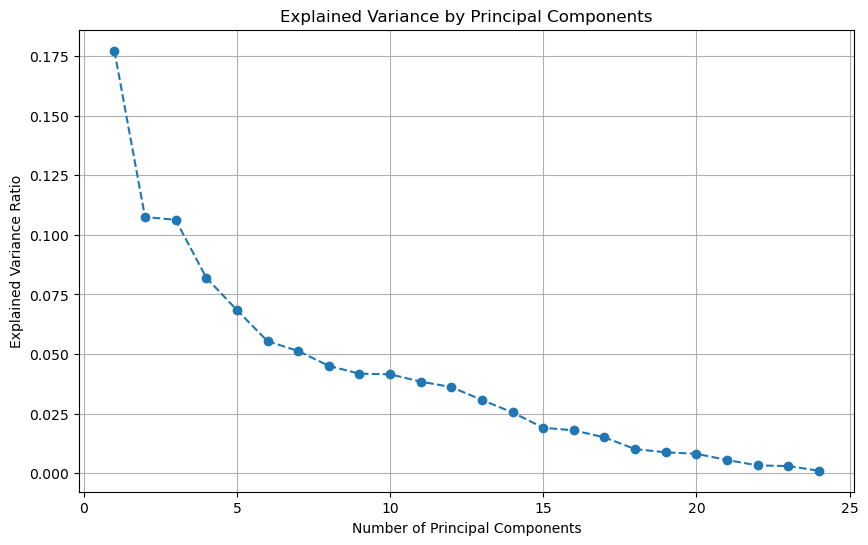

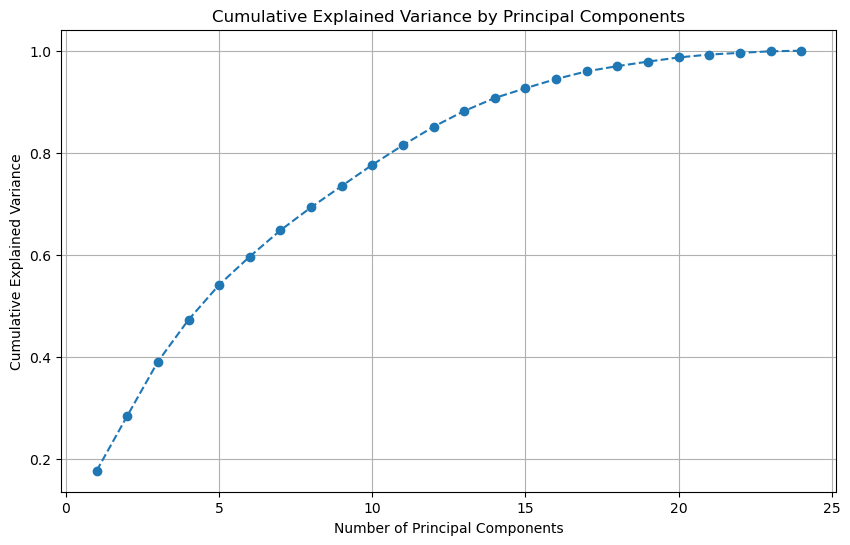

Loading scores for PC1:


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
status,0.284284,-0.154489,0.018307,-0.084396,-0.253280,-0.238188,0.221258,-0.042775,-0.031943,0.030853,-0.157729,0.109527,0.229910,-0.069301,0.467346,0.495077,0.369194
balance,0.011218,-0.184237,0.158846,0.364295,0.148990,0.417908,-0.295521,-0.115275,0.044814,-0.053821,0.083687,0.062371,-0.186548,-0.143034,0.047654,0.101683,0.544300
came_from,-0.046772,-0.212599,-0.393204,0.217926,0.401891,-0.212082,0.107611,-0.134309,0.001053,0.042814,0.010880,-0.097359,0.056100,-0.023253,0.041137,-0.005281,0.012659
lang,-0.067723,0.142511,-0.048162,-0.126514,-0.047667,-0.051707,0.048095,-0.615652,-0.051915,0.184206,-0.540029,0.119941,-0.390927,0.229904,-0.077723,-0.026956,0.082553
attentive,-0.208807,0.187434,-0.198716,-0.138498,-0.042012,-0.041728,0.037836,0.082217,0.032919,-0.002285,0.339144,-0.105391,-0.660907,-0.162196,0.434927,0.226655,-0.127435
campaign,-0.061685,-0.061432,0.449043,-0.097482,0.172523,-0.352114,-0.202227,-0.066134,-0.050467,0.012330,-0.009445,-0.270114,-0.071208,-0.026762,0.050137,-0.077415,0.016729
lead_channel,0.044323,0.122810,-0.425326,0.108392,-0.204428,0.406999,0.089573,0.042687,0.033418,-0.017194,-0.050167,0.249706,0.071777,0.097222,0.029988,-0.024523,-0.097995
data_fraud_public_ip,0.384955,0.187009,-0.079370,0.182905,-0.062968,-0.057451,-0.172952,-0.066736,-0.024047,-0.006740,-0.028463,-0.118757,-0.100713,-0.045794,0.108439,-0.204001,-0.022945
data_fraud_demo_speedrun,0.339379,-0.299922,0.126310,0.064758,-0.039649,-0.033335,0.156897,-0.032251,0.012538,0.011907,-0.057376,0.085627,-0.088410,-0.081833,0.038515,-0.000590,-0.447132
data_fraud_referral_ancestor,-0.055802,-0.227834,-0.398178,0.215584,0.382756,-0.209989,0.093843,-0.129872,0.003417,0.044321,0.010027,-0.102703,0.053582,-0.032946,0.038282,-0.003057,0.006784


In [16]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
import matplotlib.pyplot as plt

# Identify and encode categorical columns
categorical_columns = features.select_dtypes(include=['object']).columns
encoder = OrdinalEncoder()
features[categorical_columns] = encoder.fit_transform(features[categorical_columns].astype(str))

# Standardize the data
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Apply PCA
pca = PCA()
features_pca = pca.fit_transform(features_scaled)

# Determine the number of components to keep
# Plot the explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o', linestyle='--')
plt.title('Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

# Cumulative explained variance
cumulative_variance = pca.explained_variance_ratio_.cumsum()

# Plot the cumulative explained variance
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()

# Determine the number of components to keep (e.g., 95% variance)
num_components = next(i for i, total_var in enumerate(cumulative_variance) if total_var >= 0.95) + 1

# Apply PCA with the selected number of components
pca = PCA(n_components=num_components)
features_pca_reduced = pca.fit_transform(features_scaled)

# Create a DataFrame with the principal components
features_pca_df = pd.DataFrame(features_pca_reduced, columns=[f'PC{i+1}' for i in range(num_components)])

# Map the principal components to the original feature names
loading_scores = pd.DataFrame(pca.components_.T, index=features.columns, columns=[f'PC{i+1}' for i in range(num_components)])

# Display the loading scores to understand feature contributions
print("Loading scores for PC1:")
loading_scores

In [145]:
profile = load_data('data/profile.csv', ['demography_body', 'eyal_answers', 'silvana_answers'])
qualtrics = load_data('data/qualtrics_tracker.csv', ['data'])
referrals = pd.read_csv('data/referrals.csv')
event_log = load_data('data/users_event_log.csv', ['extra_data'])
users = load_data('./data/users.csv', ['data_fraud'])

full = users.merge(profile, how='left', on='user_id', suffixes=['_users', '_profile'])
full = full.merge(qualtrics, how='left', on='uuid', suffixes=['', '_qualtrics'])
full = full.merge(referrals, how='left', on='uuid', suffixes=['', '_referrals'])
full = full.merge(event_log, how='left', on='user_id', suffixes=['', '_event_log'])

In [146]:
target = full.isBot.fillna('f')
features = full.drop([
        # 'campaign', 'came_from', 'demography_body', 'eyal_answers', 'silvana_answers', 'data', 'extra_data', 
                             'score', 'id_users', 'isBot', 'user_id', 'created_at_users', 'uuid', 'pined_msg_id', 'jira_task', 'qa_range', 'ip', 'username', \
                             'id_profile', 'created_at_profile',  'id',  'created_at', \
                             'id_referrals', 'created_at_referrals', 'id_event_log', 'ip_event_log', 'created_at_event_log', ], axis=1)

In [159]:
# Engineer new abbreviated agent column based on the primary existing agent 
features['agent_sub'] = features.agent.apply(
    lambda x: 'iPhone' if 'iPhone' in str(x) else 
              'Linux' if 'Linux' in str(x) else 
              'Macintosh' if 'Macintosh' in str(x) else 
              'Windows' if 'Windows' in str(x) else 
              'Android' if 'Android' in str(x) else 
              'X11' if 'X11' in str(x) else 
              'Other'  # Default value for unmatched cases
)
features = features.drop('agent', axis=1)                          

In [160]:
# Store categorical and numeric column names
cats = list(features.select_dtypes('object').columns)
nums = list(features.select_dtypes('number').columns)

# Quickly fill missing values with 'missing' or 0 and convert numeric to float
for cat in cats:
    features[cat] = features[cat].fillna('missing').astype(str)
for num in nums:
    features[num] = features[num].fillna(0)
    features[num] = features[num].astype('float')

In [164]:
import pandas as pd
from sklearn.feature_selection import VarianceThreshold, RFE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# Convert target to binary values
target = target.apply(lambda x: 1 if x == 't' else 0)

# Identify categorical columns and encode them
categorical_columns = features.select_dtypes(include=['object']).columns
encoder = OrdinalEncoder()
features[categorical_columns] = encoder.fit_transform(features[categorical_columns].astype(str))

# Step 3: Initial Feature Reduction using Variance Threshold
selector = VarianceThreshold(threshold=0.01) 
features_reduced = selector.fit_transform(features)

# Step 4: Model-Based Feature Selection using RFE
model = RandomForestClassifier(random_state=42)
rfe = RFE(model, n_features_to_select=20)  # Adjust the number of features to select as needed
features_selected = rfe.fit_transform(features_reduced, target)

# Step 5: Dimensionality Reduction using PCA
pca = PCA(n_components=10)
features_pca = pca.fit_transform(features_selected)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features_pca, target, test_size=0.2, random_state=42)

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train a random forest model
model.fit(X_train_scaled, y_train.values.ravel())
y_pred = model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", class_report)

# Feature importances (Note: This is based on the selected features before PCA)
feature_importances = pd.Series(rfe.estimator_.feature_importances_, index=features.columns[selector.get_support()]).sort_values(ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_importances.values, y=feature_importances.index)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


Accuracy: 1.0
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      4362

    accuracy                           1.00      4362
   macro avg       1.00      1.00      1.00      4362
weighted avg       1.00      1.00      1.00      4362



ValueError: Length of values (20) does not match length of index (742)

### Exporting to CSV

In [154]:
features_abbrev = features.drop(features[target == 'f'].sample(20000, random_state=0).index)
target_abbrev = target.drop(features[target == 'f'].sample(20000, random_state=0).index)

In [156]:
features_abbrev.shape

(1809, 902)

In [157]:
target_abbrev.shape

(1809,)

In [155]:
features_abbrev.to_csv('features.csv')
target_abbrev.to_csv('target.csv')

### Random Forest (outdated)

Encode categorical columns

In [52]:
encoder = OrdinalEncoder()
encoder.fit(features[cats])
features[cats] = encoder.transform(features[cats])

In [53]:
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=0)
features_smote, target_smote = smote.fit_resample(features, target)

print('After SMOTE, counts of label \'1\': {}'.format(sum(target_smote == 't')))
print('After SMOTE, counts of label \'0\': {}'.format(sum(target_smote == 'f')))

After SMOTE, counts of label '1': 21053
After SMOTE, counts of label '0': 21053


In [54]:
scaler = StandardScaler()
scaler.fit(features_smote[nums])
features_smote[nums] = scaler.transform(features_smote[nums])

Cross validate initial version of model

In [233]:
features_train, features_test, target_train, target_test = train_test_split(features_smote, target_smote, test_size=0.25, random_state=0)

Bots exist that were flagged

In [234]:
features_train.sample(5)

,status,balance,came_from,lang,attentive,campaign,lead_channel,data_fraud_public_ip,data_fraud_demo_speedrun,data_fraud_referral_ancestor,age_min,age_max,gender,age,country,pushed,error,event,agent,recaptcha_score,comment,proxy_used
960,0.000000,-0.500319,130.000000,2.0,1.000000,54.0,0.0,0.000000,2.0,73.000000,-2.020829,-1.836789,2.000000,5.0,46.0,0.000000,0.0,0.000000,676.000000,0.535158,1.0,1.000000
41554,0.000000,-0.540631,32.000000,3.0,2.000000,54.0,0.0,0.000000,0.0,20.000000,-0.555604,-0.504517,0.000000,0.0,58.0,1.000000,0.0,0.263003,37.736997,0.535158,1.0,1.000000
36122,0.012595,-0.488632,130.000000,3.0,1.993702,54.0,0.0,0.012595,0.0,73.000000,2.456247,3.714343,0.000000,4.0,58.0,0.993702,0.0,2.006298,723.125952,0.519232,1.0,0.993702
39838,0.000000,-0.435342,118.118884,3.0,1.762233,54.0,0.0,2.000000,0.0,31.454512,-0.555604,-0.504517,0.881116,0.0,58.0,1.000000,0.0,3.000000,743.000000,-1.993720,1.0,0.000000
10126,0.000000,-0.435821,130.000000,3.0,2.000000,41.0,0.0,0.000000,0.0,73.000000,1.642233,1.160822,11.000000,3.0,58.0,1.000000,0.0,0.000000,35.000000,0.535158,1.0,1.000000


In [60]:
target_smote.value_counts(normalize=True)

isBot
f    0.5
t    0.5
Name: proportion, dtype: float64

In [59]:
# For random forest

# col_transformer = ColumnTransformer(transformers=[
#     ('ordinal encoder', OrdinalEncoder(), cats),
#     ('scaler', StandardScaler(), nums)
# ])

# rf_pipeline = Pipeline(steps=[
#     # ('col_transformer', col_transformer),
#     ('model', RandomForestClassifier(random_state=0, class_weight='balanced'))
# ])

model_rf = RandomForestClassifier(random_state=0)

results = cross_validate(model_rf, features_smote, target_smote, return_train_score=True)

print('Avg trained accuracy: ', results['train_score'].mean())
print('Avg validated accuracy: ', results['test_score'].mean())

Avg trained accuracy:  0.9919310804323966
Avg validated accuracy:  0.9868192372592735


Check out probability distributions for how bots behave.

In [236]:
model_rf.fit(features_train, target_train)
pred = model_rf.predict(features_test)

from sklearn.metrics import accuracy_score

# y_test are the true class labels
accuracy = accuracy_score(target_test, pred)
print("Accuracy:", accuracy)


Accuracy: 0.9938254013489123


In [ ]:
grid = {'criterion': ['gini', 'entropy'],
       'max_depth': [4, 6, 10],
       'n_estimators': [40, 60, 80, 100],
       'min_samples_split': [2, 3, 5],
       'min_samples_leaf': [1, 2, 4]
}

# scoring = {'accuracy': 'accuracy',
#           'recall': make_scorer(recall_score, pos_label='High'),
#           'f1': make_scorer(f1_score, pos_label='High')}

grid_search_rf = GridSearchCV(estimator=model_rf, param_grid=grid, cv=StratifiedKFold(n_splits=4), return_train_score=True, 
                           scoring='roc_auc', 
                           refit='roc_auc'
                          )

grid_search_rf.fit(features_train, target_train)

In [ ]:
grid_search_rf.best_params_

In [1]:
import shap

explainer = shap.Explainer(model_rf)
shap_values = explainer(features_train)

shap.plots.bar(shap_values)

NameError: name 'model_rf' is not defined

In [226]:
import shap

# Initialize the SHAP explainer (Tree explainer is typically used for tree-based models like RandomForest)
explainer = shap.Explainer(model_rf)

# You need to transform the features_test to pass through the same preprocessing as the training data
# Since the pipeline's ColumnTransformer does this, you can use it to transform your test data
# transformed_features_test = grid_search_rf.best_estimator_.named_steps['col_transformer'].transform(features_test)

# Compute SHAP values
shap_values = explainer.shap_values(features_train)

# SHAP Summary Plot
shap.summary_plot(shap_values, features_train)


KeyboardInterrupt: 

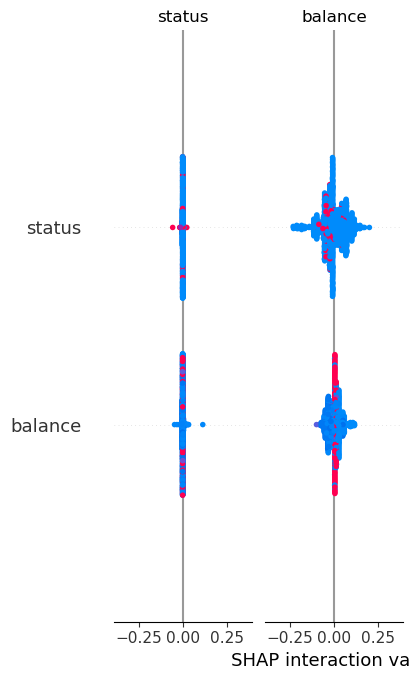

In [163]:
import shap

# Assuming grid_search_rf is your trained GridSearchCV object
best_rf_model = grid_search_rf.best_estimator_['model']

# Initialize the SHAP explainer (Tree explainer is typically used for tree-based models like RandomForest)
explainer = shap.TreeExplainer(model_rf)

# Compute SHAP values
shap_values = explainer.shap_values(features)

# SHAP Summary Plot
shap.summary_plot(shap_values, features)
plt.show()

# shap.dependence_plot('balance')


Try embedding JSON features to get more features.

Use classification_report

Drop score due to colinearity.

Can trace ancestor value back to source - track bot ancestors.

Pivoting, looking at specific other features/columns

### Logistic Regression (outdated)

In [ ]:
features = full_prelim.drop(['id_users', 'isBot', 'user_id', 'created_at_users', 'uuid', 'pined_msg_id', 'jira_task', 'qa_range', 'ip', 'username', \
                             'demography_body', 'id_profile', 'created_at_profile', 'eyal_answers', 'silvana_answers', 'id', 'data', 'created_at', \
                             'id_referrals', 'created_at_referrals', 'id_event_log', 'ip_event_log', 'created_at_event_log', 'extra_data'], axis=1)

In [18]:
features = pd.get_dummies(features, drop_first=True)

In [ ]:
col_transformer = ColumnTransformer(transformers=[
    # ('ohe', OneHotEncoder(), cats),
    ('scaler', StandardScaler(), nums)
])

log_reg_pipeline = Pipeline(steps=[
    ('col_transformer', col_transformer),
    ('model', LogisticRegression(solver='liblinear', random_state=0))
])

results = cross_validate(log_reg_pipeline, features, target, return_train_score=True, error_score='raise')

In [20]:
print(results['train_score'].mean())
print(results['test_score'].mean())

0.8210965964631655
0.8167835988896904


In [21]:
from sklearn.metrics import make_scorer, roc_auc_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold

grid = {'model__C': [0.5, 1, 2, 3, 30, 40, 50],
       'model__max_iter': [1750, 3000],
       'model__tol': [0.001, 0.01, 0.1]}

# scoring = {'accuracy': 'accuracy',
#           'recall': make_scorer(recall_score, pos_label='t'),
#           'auc-roc': 'roc_auc_score'}

grid_search_lr = GridSearchCV(estimator=log_reg_pipeline, param_grid=grid, cv=StratifiedKFold(n_splits=4), return_train_score=True, 
                           scoring='roc_auc', 
                           refit='roc_auc'
                          )
grid_search_lr.fit(features, target)

GridSearchCV(cv=StratifiedKFold(n_splits=4, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('col_transformer',
                                        ColumnTransformer(transformers=[('scaler',
                                                                         StandardScaler(),
                                                                         ['balance',
                                                                          'score',
                                                                          'age_min',
                                                                          'age_max',
                                                                          'recaptcha_score'])])),
                                       ('model',
                                        LogisticRegression(random_state=0,
                                                           solver='liblinear'))]),
             param_grid={'model__C': [0.5, 1, 2, 3, 30, 40, 50],
                         'model__max_iter': [1750, 3000],
                         'model__tol': [0.001, 0.01, 0.1]},
             refit='roc_auc', return_train_score=True, scoring='roc_auc')

In [142]:
import shap

best_lr_model = grid_search_lr.best_estimator_['model']

explainer = shap.Explainer(best_lr_model)

shap_values = explainer.shap_values(features)

shap.summary_plot(shap_values, features)


TypeError: The passed model is not callable and cannot be analyzed directly with the given masker! Model: LogisticRegression(C=30, max_iter=1750, random_state=0, solver='liblinear',
                   tol=0.001)